# Corona virus: Fact or Hype
<p align="center">
	<img src="figures/covid-19.jpg" width=500>
</p>

## Introduction
Lets first note that both fact and hype exist in discussions regarding COVID-19.  This notebook will only consider data available from the [Centers for Disease Control and Prevention](https://www.cdc.gov/coronavirus/2019-ncov/index.html) (CDC) and [World Health Organization](https://www.who.int/csr/don/12-january-2020-novel-coronavirus-china/en/) (WHO).  As Data Scientists, our job is to look at data to make informed data-driven decisions.



## Data Collection
So, is this really a pandemic, or just hype?  According to the CDC, COVID-19 **may** be 10x worse than the [common flu](https://www.cdc.gov/coronavirus/2019-ncov/index.html) in terms of mortality rate, though some people will contract COVID-19 and have little to no symptoms whatsoever.

If you are reading this notebook, you realize that you are more than a lay-person.  You have powerful tools at your fingertips ([Data Science](https://github.com/dsbc2020/ml_training/tree/master/notebooks/10-steps-to-DS), [Python](https://github.com/dsbc2020/ml_training/tree/master/notebooks/Python-in-2-days), and [Machine Learning](https://github.com/dsbc2020/ml_training/tree/master/notebooks/Machine-Learning-in-1-day)), and you likely have access to the [Coronavirus raw data](https://github.com/dsbc2020/ml_training/tree/master/notebooks/Examples/coronavirus/data) so that you can analyze and formulate your own opinion.  You realize that to be a Data Scientist requires you to be a creative and critical thinker... an individual.

Team DSBC had the same notion!

So we collected data from the CDC and WHO websites.  But we didn't stop there.  We are critical thinkers too.  We also collected data for:
- [Coronavirus international incidence dates](https://www.washington.edu/news/2020/02/07/interactive-map-shows-worldwide-spread-of-coronavirus/)
- [2009 H1N1 Swine Flu](https://academic.oup.com/cid/article/52/suppl_1/S75/499147#97947460), [here](https://www.cdc.gov/flu/spotlights/pandemic-global-estimates.htm), [here](http://www.cidrap.umn.edu/news-perspective/2011/08/study-puts-global-2009-h1n1-infection-rate-11-21), [here](https://www.cdc.gov/flu/pandemic-resources/2009-pandemic-timeline.html), [and here](https://en.wikipedia.org/wiki/2009_flu_pandemic_timeline#March_2009)
- [Ebola](https://www.cdc.gov/vhf/ebola/history/2014-2016-outbreak/case-counts.html)
- [SARS](https://www.who.int/csr/sars/country/en/)
- [MERS](https://hazards.colorado.edu/quick-response-report/dynamics-of-interorganizational-risk-management-networks-during-the-2015-mers-response-in-south-korea)
- [1918 Spanish Flu](https://www.cdc.gov/flu/pandemic-resources/1918-commemoration/pandemic-timeline-1918.htm) [and here](https://wwwnc.cdc.gov/eid/article/12/1/05-0979_article)


Just for completeness, we also collected data on:
- Stock Prices: [DJIA](https://www.wsj.com/market-data/quotes/index/DJIA/historical-prices), [NASDAQ](https://www.wsj.com/market-data/quotes/index/COMP/historical-prices), [S&P 500](https://www.wsj.com/market-data/quotes/index/SPX/historical-prices)
- [Car crashes](https://www.asirt.org/safe-travel/road-safety-facts/)
- [Suicides](https://www.medicalnewstoday.com/articles/234219.php#1)
- [Cancer](https://www.who.int/news-room/fact-sheets/detail/cancer)
- [Ischemic Heart Disease](https://www.ahajournals.org/doi/10.1161/CIRCOUTCOMES.118.005375)
- [Generic US Flu](https://www.cdc.gov/flu/about/burden/preliminary-in-season-estimates.htm)
- [Stroke](http://www.strokecenter.org/patients/about-stroke/stroke-statistics/)
- [Drowning](https://www.who.int/news-room/fact-sheets/detail/drowning) 
- [Bed strangulation](https://www.businessinsider.com/weird-causes-of-death-2016-7#w75-accidental-suffocation-and-strangulation-in-bed--10206-deaths-7)
[also here](https://wonder.cdc.gov/controller/datarequest/D76)
- [SIDS](https://pediatrics.aappublications.org/content/pediatrics/122/3/660.full.pdf?download=true)
- [Domestic Violence](https://www.npr.org/sections/goatsandsoda/2018/11/30/671872574/u-n-report-50-000-women-a-year-are-killed-by-intimate-partners-family-members)
- [Animal deaths](https://www.businessinsider.com/worlds-deadliest-animals-2016-9/)
- [Alzheimer's](https://braintest.com/alzheimers-statistics-throughout-the-united-states-and-worldwide/)
- [Malaria](https://www.childfund.org/infographic/malaria/)
- [Homicide](https://ourworldindata.org/homicides)



## Great videos to watch
 - ["Exponential growth and epidemics"](https://youtu.be/Kas0tIxDvrg)
 - ["How To See Germs Spread - Coronavirus"](https://youtu.be/I5-dI74zxPg)
 - ["We heard the bells: The influenza of 1918"](https://youtu.be/XkGi9FKZzDI)
 - ["1918 Spanish Flu historical documentary | Swine Flu Pandemic | Deadly plague of 1918"](https://youtu.be/UDY5COg2P2c)



## Table of Contents:
* [1. Preprocessing](#Preprocessing)
* [2. Initial COVID-19 Analysis](#initial_covid_19_analysis)
* [3. COVID-19 Maps](#covid_19_maps)
* [4. Comparison: COVID-19, SARS, Ebola, MERS, H1N1](#comparison_covid_19_sars_ebola_mers_h1n1)
* [5. Comparison: Common Flu, Car Crashes, etc.](#comparison_everything_else)
* [6. Case Study: China rate of recovery?](#case_study_china)
* [7. Case Study: World rate of recovery?](#case_study_not_china)
* [8. Initial Analysis](#initial_analysis)
* [9. Conclusions](#conclusion)



# Set-up
As with all of our notebooks, we begin with the standard imports:

In [91]:
# storing and anaysis
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# visualization
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from plotnine import *
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium
import json, requests
import branca
import pycountry_convert as pc
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px

# Machine Learning
from keras.layers import Input, Dense, Activation, LeakyReLU
from keras import models
from keras.optimizers import RMSprop, Adam

# color pallette
s = '#f0134d'
h = '#12cad6'
e = '#4a47a3'
m = '#42e6a4'
#c = '#333333'
c = '#393e46'
d = '#ff2e63'
r = '#30e3ca'
i = '#f8b400'
cdr = [c, d, r] # grey - red - blue
idr = [i, d, r] # yellow - red - blue
shemc = [s, h, e, m, c]
hcesm = [h, c, e, s, m]
emsch = [e, m, s, c, h]
hcsme = [h, c, s, m, e]
sec = [s, e, c]
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

# Functions

In [92]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = ""#+"output/"

# Preprocessing <a class="anchor" id="Preprocessing"></a>

In [93]:
# COVID-19
# --------

# importing datasets
covid_19 = pd.read_csv('data/novel-corona-virus-2019-dataset/covid_19_data.csv', 
                         parse_dates=['Date'])

# selecting important columns only
covid_19 = covid_19[['Date', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered']]

# replacing Mainland china with just China
covid_19['Country/Region'] = covid_19['Country/Region'].replace('Mainland China', 'China')

# renaming columns
covid_19.columns = ['Date', 'Country', 'Cases', 'Deaths', 'Recovered']

# group by date and country
covid_19 = covid_19.groupby(['Date', 'Country'])['Cases', 'Deaths', 'Recovered']
covid_19 = covid_19.sum().reset_index()

# latest
c_lat = covid_19[covid_19['Date'] == max(covid_19['Date'])].reset_index()

# latest grouped by country
c_lat_grp = c_lat.groupby('Country')['Cases', 'Deaths', 'Recovered'].sum().reset_index()

# nth day
covid_19['nth_day'] = (covid_19['Date'] - min(covid_19['Date'])).dt.days

# day by day
c_dbd = covid_19.groupby('Date')['Cases', 'Deaths', 'Recovered'].sum().reset_index()

# nth day
c_dbd['nth_day'] = covid_19.groupby('Date')['nth_day'].max().values

# no. of countries
temp = covid_19[covid_19['Cases']>0]
c_dbd['n_countries'] = temp.groupby('Date')['Country'].apply(len).values

covid_19.head()

,Date,Country,Cases,Deaths,Recovered,nth_day
0,2020-01-22,China,547.0,17.0,28.0,0
1,2020-01-22,Hong Kong,0.0,0.0,0.0,0
2,2020-01-22,Japan,2.0,0.0,0.0,0
3,2020-01-22,Macau,1.0,0.0,0.0,0
4,2020-01-22,South Korea,1.0,0.0,0.0,0


In [94]:
# importing datasets
full_table = pd.read_csv('data/corona-virus-report/covid_19_clean_complete.csv', 
                         parse_dates=['Date'])
#full_table = pd.read_csv('data/corona-virus-report/complete_data_new_format.csv', 
#                         parse_dates=['Date'])
full_table.head()

# cases 
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']

# Active Case = confirmed - deaths - recovered
full_table['Active'] = full_table['Confirmed'] - full_table['Deaths'] - full_table['Recovered']

# replacing Mainland china with just China
full_table['Country/Region'] = full_table['Country/Region'].replace('Mainland China', 'China')

# filling missing values 
full_table[['Province/State']] = full_table[['Province/State']].fillna('')
full_table[cases] = full_table[cases].fillna(0)

# cases in the ships
ship = full_table[full_table['Province/State'].str.contains('Grand Princess')|full_table['Country/Region'].str.contains('Cruise Ship')]

# china and the row
china = full_table[full_table['Country/Region']=='China']
row = full_table[full_table['Country/Region']!='China']

# latest
full_latest = full_table[full_table['Date'] == max(full_table['Date'])].reset_index()
china_latest = full_latest[full_latest['Country/Region']=='China']
row_latest = full_latest[full_latest['Country/Region']!='China']

# latest condensed
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

# latest complete data
temp = full_table.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered', 'Active'].max()

# latest condensed data
temp = full_table.groupby('Date')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
temp = temp[temp['Date']==max(temp['Date'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')


,Date,Confirmed,Deaths,Recovered,Active
0,2020-04-19 00:00:00,2401373,165043,612042,1624288


In [95]:
full_table

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,,Afghanistan,33.000000,65.000000,2020-01-22,0,0,0,0
1,,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
23313,Saint Pierre and Miquelon,France,46.885200,-56.315900,2020-04-19,1,0,0,1
23314,,South Sudan,6.877000,31.307000,2020-04-19,4,0,0,4
23315,,Western Sahara,24.215500,-12.885800,2020-04-19,6,0,0,6
23316,,Sao Tome and Principe,0.186360,6.613081,2020-04-19,4,0,0,4


In [96]:
# EBOLA
# ------

# ebola dataset
ebola_14 = pd.read_csv("data/ebola-outbreak-20142016-complete-dataset/ebola_2014_2016_clean.csv", 
                       parse_dates=['Date'])

# selecting important columns only
ebola_14 = ebola_14[['Date', 'Country', 'No. of confirmed, probable and suspected cases',
                     'No. of confirmed, probable and suspected deaths']]

# renaming columns
ebola_14.columns = ['Date', 'Country', 'Cases', 'Deaths']
ebola_14.head()

# group by date and country
ebola_14 = ebola_14.groupby(['Date', 'Country'])['Cases', 'Deaths']
ebola_14 = ebola_14.sum().reset_index()

# filling missing values
ebola_14['Cases'] = ebola_14['Cases'].fillna(0)
ebola_14['Deaths'] = ebola_14['Deaths'].fillna(0)

# converting datatypes
ebola_14['Cases'] = ebola_14['Cases'].astype('int')
ebola_14['Deaths'] = ebola_14['Deaths'].astype('int')

# latest
e_lat = ebola_14[ebola_14['Date'] == max(ebola_14['Date'])].reset_index()

# latest grouped by country
e_lat_grp = e_lat.groupby('Country')['Cases', 'Deaths'].sum().reset_index()

# nth day
ebola_14['nth_day'] = (ebola_14['Date'] - min(ebola_14['Date'])).dt.days

# day by day
e_dbd = ebola_14.groupby('Date')['Cases', 'Deaths'].sum().reset_index()

# nth day
e_dbd['nth_day'] = ebola_14.groupby('Date')['nth_day'].max().values

# no. of countries
temp = ebola_14[ebola_14['Cases']>0]
e_dbd['n_countries'] = temp.groupby('Date')['Country'].apply(len).values

ebola_14.head()

,Date,Country,Cases,Deaths,nth_day
0,2014-08-29,Guinea,648,430,0
1,2014-08-29,Liberia,1378,694,0
2,2014-08-29,Nigeria,19,7,0
3,2014-08-29,Sierra Leone,1026,422,0
4,2014-09-05,Guinea,812,517,7


In [97]:
# SARS
# ----

# sars dataset
sars_03 = pd.read_csv("data/sars-outbreak-2003-complete-dataset/sars_2003_complete_dataset_clean.csv", 
                       parse_dates=['Date'])

# selecting important columns only
sars_03 = sars_03[['Date', 'Country', 'Cumulative number of case(s)', 
                   'Number of deaths', 'Number recovered']]

# renaming columns
sars_03.columns = ['Date', 'Country', 'Cases', 'Deaths', 'Recovered']

# group by date and country
sars_03 = sars_03.groupby(['Date', 'Country'])['Cases', 'Deaths', 'Recovered']
sars_03 = sars_03.sum().reset_index()

# latest
s_lat = sars_03[sars_03['Date'] == max(sars_03['Date'])].reset_index()

# latest grouped by country
s_lat_grp = s_lat.groupby('Country')['Cases', 'Deaths', 'Recovered'].sum().reset_index()

# nth day
sars_03['nth_day'] = (sars_03['Date'] - min(sars_03['Date'])).dt.days

# day by day
s_dbd = sars_03.groupby('Date')['Cases', 'Deaths', 'Recovered'].sum().reset_index()

# nth day
s_dbd['nth_day'] = sars_03.groupby('Date')['nth_day'].max().values

# no. of countries
temp = sars_03[sars_03['Cases']>0]
s_dbd['n_countries'] = temp.groupby('Date')['Country'].apply(len).values

s_dbd.head()

,Date,Cases,Deaths,Recovered,nth_day,n_countries
0,2003-03-17,167,4,0,0,7
1,2003-03-18,219,4,0,1,9
2,2003-03-19,264,9,0,2,11
3,2003-03-20,306,10,0,3,12
4,2003-03-21,350,10,0,4,14


In [98]:
e_dbd['new_cases'] = e_dbd['Cases'].diff()
c_dbd['new_cases'] = c_dbd['Cases'].diff()
s_dbd['new_cases'] = s_dbd['Cases'].diff()

e_dbd['new_deaths'] = e_dbd['Deaths'].diff()
c_dbd['new_deaths'] = c_dbd['Deaths'].diff()
s_dbd['new_deaths'] = s_dbd['Deaths'].diff()

e_dbd['epidemic'] = 'EBOLA'
c_dbd['epidemic'] = 'COVID-19'
s_dbd['epidemic'] = 'SARS'

# Initial COVID-19 Analysis <a class="anchor" id="initial_covid_19_analysis"></a>

In [99]:
# dataframe info
covid_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9044 entries, 0 to 9043
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       9044 non-null   datetime64[ns]
 1   Country    9044 non-null   object        
 2   Cases      9044 non-null   float64       
 3   Deaths     9044 non-null   float64       
 4   Recovered  9044 non-null   float64       
 5   nth_day    9044 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(1), object(1)
memory usage: 424.1+ KB


In [100]:
# still infected = confirmed - deaths - recovered
covid_19['Still Infected'] = covid_19['Cases'] - covid_19['Deaths'] -covid_19['Recovered']

# replacing Mainland china with just China
covid_19['Country'] = covid_19['Country'].replace('Mainland China', 'China')

# filling missing values with NA
#covid_19[['Province/State']] = covid_19[['Province/State']].fillna('NA')
#covid_19[['Confirmed', 'Deaths', 'Recovered', 'Still Infected']] = covid_19[['Confirmed', 'Deaths', 'Recovered', 'Still Infected']].fillna(0)

In [101]:
temp = covid_19.groupby('Date')['Cases', 'Deaths', 'Recovered', 'Still Infected'].sum()
temp = temp.reset_index()
temp = temp.sort_values('Date', ascending=False)
temp.head(1).reset_index(drop=True).style.background_gradient(cmap='Pastel1')

,Date,Cases,Deaths,Recovered,Still Infected
0,2020-04-19 00:00:00,2401379.000000,165044.000000,623903.000000,1612432.000000


In [102]:
tm = temp.head(1).melt(id_vars="Date", value_vars=['Still Infected', 'Deaths', 'Recovered'])
fig = px.treemap(tm, path=["variable"], values="value", height=200, 
                 color_discrete_sequence = [r, i, d])
fig.show()

In [103]:
# cases in the Diamond Princess cruise ship
ship = covid_19[covid_19['Country']=='Diamond Princess cruise ship']

# full table
china = covid_19[covid_19['Country']=='China']
row = covid_19[covid_19['Country']!='China']

# latest
covid_19_latest = covid_19[covid_19['Date'] == max(covid_19['Date'])].reset_index()
china_latest = covid_19_latest[covid_19_latest['Country']=='China']
row_latest = covid_19_latest[covid_19_latest['Country']!='China']

# latest condensed
covid_19_latest_grouped = covid_19_latest.groupby('Country')['Cases', 'Deaths', 'Recovered', 'Still Infected'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Country')['Cases', 'Deaths', 'Recovered', 'Still Infected'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country')['Cases', 'Deaths', 'Recovered', 'Still Infected'].sum().reset_index()

## In each country

In [104]:
temp_f = covid_19_latest_grouped[['Country', 'Cases', 'Deaths', 'Recovered']]
temp_f = temp_f.sort_values(by='Cases', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')


,Country,Cases,Deaths,Recovered
0,US,759086.000000,40661.000000,70337.000000
1,Spain,198674.000000,20453.000000,77357.000000
2,Italy,178972.000000,23660.000000,47055.000000
3,France,154097.000000,19744.000000,37183.000000
4,Germany,145184.000000,4586.000000,88000.000000
5,UK,121172.000000,16095.000000,436.000000
6,Turkey,86306.000000,2017.000000,11976.000000
7,China,82735.000000,4632.000000,77068.000000
8,Iran,82211.000000,5118.000000,57023.000000
9,Russia,42853.000000,361.000000,3291.000000


## Countries with deaths reported

In [105]:
temp_flg = covid_19_latest_grouped[['Country', 'Deaths']]
temp_flg = temp_flg.sort_values(by='Deaths', ascending=False)
temp_flg = temp_flg.reset_index(drop=True)
temp_flg = temp_flg[temp_flg['Deaths']>0]
temp_flg.style.background_gradient(cmap='Reds')

,Country,Deaths
0,US,40661.000000
1,Italy,23660.000000
2,Spain,20453.000000
3,France,19744.000000
4,UK,16095.000000
5,Belgium,5683.000000
6,Iran,5118.000000
7,China,4632.000000
8,Germany,4586.000000
9,Netherlands,3697.000000


## Countries with all the cases recovered

In [106]:
temp = row_latest_grouped[row_latest_grouped['Cases']==
                          row_latest_grouped['Recovered']]
temp = temp[['Country', 'Cases', 'Recovered']]
temp = temp.sort_values('Cases', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Country,Cases,Recovered


## Countries where all cases died

In [107]:
temp = row_latest_grouped[row_latest_grouped['Cases']==
                          row_latest_grouped['Deaths']]
temp = temp[['Country', 'Cases', 'Deaths']]
temp = temp.sort_values('Cases', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

,Country,Cases,Deaths


## Number of cases in each country

In [108]:
fig = px.bar(covid_19_latest_grouped[['Country', 'Cases']].sort_values('Cases', ascending=False), 
             x="Cases", y="Country", color='Country', orientation='h',
             log_x=True, color_discrete_sequence = px.colors.qualitative.Bold, title='Confirmed Cases', width=900, height=1200)
fig.show()

temp = covid_19_latest_grouped[['Country', 'Deaths']].sort_values('Deaths', ascending=False)
fig = px.bar(temp[temp['Deaths']>0], 
             x="Deaths", y="Country", color='Country', title='Deaths', orientation='h',
             log_x=True, color_discrete_sequence = px.colors.qualitative.Bold, width=900)
fig.show()
#fig.to_image("Global Heat Map confirmed.png")

## Number of cases each day

In [109]:
temp = covid_19.groupby(['Country', 'Date'])['Cases', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()
# temp.head()

fig = px.bar(temp, x="Date", y="Cases", color='Country', orientation='v', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

fig = px.bar(temp, x="Date", y="Deaths", color='Country', orientation='v', height=600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

## Composition of Cases

In [110]:
fig = px.treemap(row_latest, path=["Country"], values="Cases", 
                 title='Number of Confirmed Cases outside china',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/covid_19_block_chart_confirmed.png")

fig = px.treemap(row_latest, path=["Country"], values="Deaths", 
                 title='Number of Deaths outside china',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/covid_19_block_chart_deaths.png")

fig = px.treemap(row_latest, path=["Country"], values="Recovered", 
                 title='Number of Recovered Cases outside china',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/covid_19_block_chart_recovered.png")

# COVID-19 Maps <a class="anchor" id="covid_19_maps"></a>

In [111]:
# Spread over time
formated_gdf = covid_19.groupby(['Date', 'Country'])['Cases', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf = formated_gdf[formated_gdf['Country']!='China']
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Cases'].pow(0.5)

fig = px.scatter_geo(formated_gdf[formated_gdf['Country']!='China'], 
                     locations="Country", locationmode='country names', 
                     color="Cases", size='size', hover_name="Country", 
                     range_color= [0, max(formated_gdf['Cases'])+2], 
                     projection="natural earth", animation_frame="Date", 
                     title='Spread outside China over time')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [112]:
# World wide

#m = folium.Map(location=[0, 0], tiles='cartodbpositron',
#               min_zoom=1, max_zoom=4, zoom_start=1)
#
#for i in range(0, len(full_latest)):
#    folium.Circle(
#        location=[full_latest.iloc[i]['Lat'], full_latest.iloc[i]['Long']],
#        color='crimson', 
#        tooltip =   '<li><bold>Country : '+str(full_latest.iloc[i]['Country/Region'])+
#                    '<li><bold>Province : '+str(full_latest.iloc[i]['Province/State'])+
#                    '<li><bold>Confirmed : '+str(full_latest.iloc[i]['Confirmed'])+
#                    '<li><bold>Deaths : '+str(full_latest.iloc[i]['Deaths'])+
#                    '<li><bold>Recovered : '+str(full_latest.iloc[i]['Recovered']),
#        radius=int(full_latest.iloc[i]['Confirmed'])**1.1).add_to(m)
#m

In [113]:
# Confirmed
#fig = px.choropleth(full_latest_grouped, locations="Country/Region", 
#                    locationmode='country names', color=np.log(full_latest_grouped["Confirmed"]), 
#                    hover_name="Country/Region", hover_data=['Confirmed'],
#                    color_continuous_scale="Sunsetdark", 
#                    title='Countries with Confirmed Cases')
fig = px.choropleth(full_latest_grouped, locations="Country/Region", 
                    locationmode='country names', color=full_latest_grouped["Confirmed"], 
                    hover_name="Country/Region", hover_data=['Confirmed'],
                    color_continuous_scale="Sunsetdark", 
                    title='Countries with Confirmed Cases')
fig.update(layout_coloraxis_showscale=True)
fig.show()
fig.write_image("figures/covid_19_worldwide_confirmed.png")

# Deaths
temp = full_latest_grouped[full_latest_grouped['Deaths']>0]
#fig = px.choropleth(temp, 
#                    locations="Country/Region", locationmode='country names',
#                    color=np.log(temp["Deaths"]), hover_name="Country/Region", 
#                    color_continuous_scale="Sunsetdark", hover_data=['Deaths'],
#                    title='Countries with Deaths Reported')
fig = px.choropleth(temp, 
                    locations="Country/Region", locationmode='country names',
                    color=temp["Deaths"], hover_name="Country/Region", 
                    color_continuous_scale="Sunsetdark", hover_data=['Deaths'],
                    title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=True)
fig.show()
fig.write_image("figures/covid_19_worldwide_deaths.png")

In [114]:
us_df = pd.read_csv("data/covid19-in-usa/us_covid19_daily.csv")
us_states_df = pd.read_csv("data/covid19-in-usa/us_states_covid19_daily.csv")
us_df["date"] = pd.to_datetime(us_df["date"], format="%Y%m%d")
us_states_df = us_states_df.reindex(index=us_states_df.index[::-1])
us_states_df["date"] = pd.to_datetime(us_states_df["date"], format="%Y%m%d").dt.date.astype(str)
#us_states_df.head()

# US state code to name mapping
state_map_dict = {'AL': 'Alabama',
 'AK': 'Alaska',
 'AS': 'American Samoa',
 'AZ': 'Arizona',
 'AR': 'Arkansas',
 'CA': 'California',
 'CO': 'Colorado',
 'CT': 'Connecticut',
 'DE': 'Delaware',
 'DC': 'District of Columbia',
 'D.C.': 'District of Columbia',
 'FM': 'Federated States of Micronesia',
 'FL': 'Florida',
 'GA': 'Georgia',
 'GU': 'Guam',
 'HI': 'Hawaii',
 'ID': 'Idaho',
 'IL': 'Illinois',
 'IN': 'Indiana',
 'IA': 'Iowa',
 'KS': 'Kansas',
 'KY': 'Kentucky',
 'LA': 'Louisiana',
 'ME': 'Maine',
 'MH': 'Marshall Islands',
 'MD': 'Maryland',
 'MA': 'Massachusetts',
 'MI': 'Michigan',
 'MN': 'Minnesota',
 'MS': 'Mississippi',
 'MO': 'Missouri',
 'MT': 'Montana',
 'NE': 'Nebraska',
 'NV': 'Nevada',
 'NH': 'New Hampshire',
 'NJ': 'New Jersey',
 'NM': 'New Mexico',
 'NY': 'New York',
 'NC': 'North Carolina',
 'ND': 'North Dakota',
 'MP': 'Northern Mariana Islands',
 'OH': 'Ohio',
 'OK': 'Oklahoma',
 'OR': 'Oregon',
 'PW': 'Palau',
 'PA': 'Pennsylvania',
 'PR': 'Puerto Rico',
 'RI': 'Rhode Island',
 'SC': 'South Carolina',
 'SD': 'South Dakota',
 'TN': 'Tennessee',
 'TX': 'Texas',
 'UT': 'Utah',
 'VT': 'Vermont',
 'VI': 'Virgin Islands',
 'VA': 'Virginia',
 'WA': 'Washington',
 'WV': 'West Virginia',
 'WI': 'Wisconsin',
 'WY': 'Wyoming'}

state_code_dict = {v:k for k, v in state_map_dict.items()}
state_code_dict["Chicago"] = 'Illinois'

def correct_state_names(x):
    try:
        return state_map_dict[x.split(",")[-1].strip()]
    except:
        return x.strip()
    
def get_state_codes(x):
    try:
        return state_code_dict[x]
    except:
        return "Others"

covid_19_df = pd.read_csv("data/novel-corona-virus-2019-dataset/covid_19_data.csv")
us_covid_df = covid_19_df[covid_19_df["Country/Region"]=="US"]
us_covid_df["Province/State"] = us_covid_df["Province/State"].apply(correct_state_names)
us_covid_df["StateCode"] = us_covid_df["Province/State"].apply(lambda x: get_state_codes(x))

us_latest = us_covid_df[us_covid_df['Date']==max(us_covid_df['Date'])]
us_latest['Code'] = us_covid_df['Province/State'].map(state_map_dict)

# Confirmed
fig = px.choropleth(us_latest, locations='StateCode', locationmode="USA-states", 
                    color='Confirmed', scope="usa", color_continuous_scale="Sunsetdark", 
                    hover_data = ['Province/State', 'Confirmed', 'Deaths', 'Recovered'], title='Confirmed Cases')
fig.show()
fig.write_image("figures/covid_19_usa_confirmed.png")

# Deaths
fig = px.choropleth(us_latest, locations='StateCode', locationmode="USA-states", 
                    color='Deaths', scope="usa", color_continuous_scale="Sunsetdark", 
                    hover_data = ['Province/State', 'Confirmed', 'Deaths', 'Recovered'], title='Deaths')
fig.show()
fig.write_image("figures/covid_19_usa_deaths.png")



In [115]:
fig = px.treemap(us_covid_df, path=["Province/State"], values="Confirmed", 
                 title='USA Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/covid_19_block_chart_usa_confirmed.png")


fig = px.treemap(us_covid_df, path=["Province/State"], values="Deaths", 
                 title='USA Deaths',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/covid_19_block_chart_usa_deaths.png")

In [116]:
df_temp = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/04-20-2020.csv")
#df_temp = pd.read_csv("data/corona-virus-report/usa_county_wise.csv")
df_usa = df_temp.loc[df_temp["Country_Region"]== "US"]
df_usa = df_usa.rename(columns={"Admin2":"County"})

total = df_usa.sum()
total.name = "Total"
pd.DataFrame(total).transpose().loc[:,["Confirmed","Deaths"]].style.background_gradient(cmap='Purples',axis=1)

df_usa.loc[:,["Confirmed","Deaths","Province_State"]].groupby(["Province_State"]).sum().sort_values("Confirmed",ascending=False).style.background_gradient(cmap='Blues',subset=["Confirmed"]).background_gradient(cmap='Reds',subset=["Deaths"])


,Confirmed,Deaths
Province_State,,
New York,253060,18611
New Jersey,88722,4496
Massachusetts,38077,1706
Pennsylvania,33914,1348
California,33686,1225
Michigan,32000,2468
Illinois,31513,1349
Florida,27059,822
Louisiana,24523,1328


In [117]:
# Top 15 affected Cities or Counties:
df_usa.loc[:,["Province_State","Confirmed","Deaths","County"]].sort_values("Confirmed",ascending=False).set_index("County")[:15].style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])

,Province_State,Confirmed,Deaths
County,,,
New York City,New York,141235,14604
Nassau,New York,30677,1329
Suffolk,New York,28127,859
Westchester,New York,24306,776
Cook,Illinois,22101,915
Wayne,Michigan,13912,1148
Los Angeles,California,13823,619
Bergen,New Jersey,13011,787
Hudson,New Jersey,11150,612


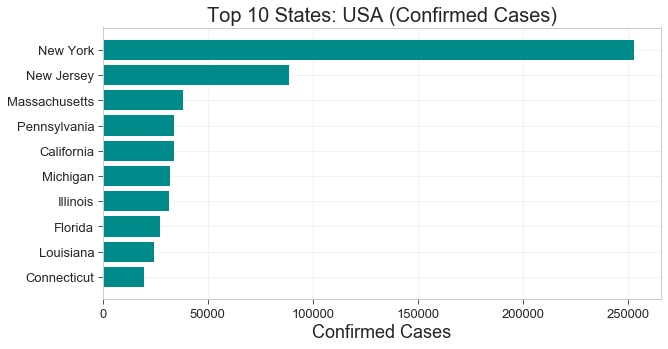

In [118]:
# Most Affected States: USA
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].index[-10:],df_usa.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 States: USA (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'figures/Top 10 States_USA (Confirmed Cases).png')
#fig.write_image("figures/covid_19_block_chart_recovered.png")


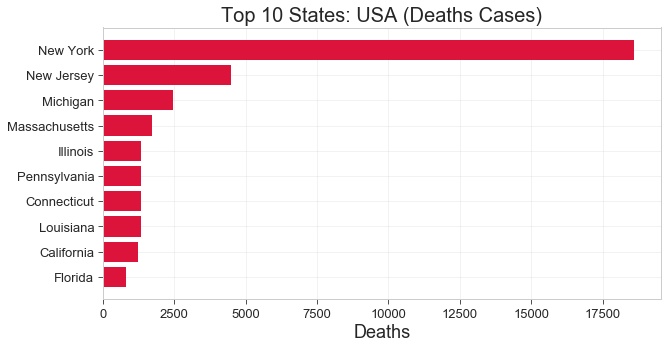

In [119]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa.groupby(["Province_State"]).sum().sort_values('Deaths')["Deaths"].index[-10:],df_usa.groupby(["Province_State"]).sum().sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths",fontsize=18)
plt.title("Top 10 States: USA (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States_USA (Deaths Cases).png')

In [120]:
df_usa = df_usa.replace(np.nan, 0, regex=True)
usa = folium.Map(location=[37, -97], zoom_start=4,max_zoom=8,min_zoom=4)
for i in np.int32(np.asarray(df_usa[df_usa['Confirmed'] > 0].index)):
    folium.Circle(
        location=[df_usa.loc[i]['Lat'], df_usa.loc[i]['Long_']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_usa.loc[i]['Province_State']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_usa.loc[i]['County']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_usa.loc[i]['Confirmed'])+"</li>"+
        "<li>Active:   "+str(df_usa.loc[i]['Active'])+"</li>"+
        "<li>Recovered:   "+str(df_usa.loc[i]['Recovered'])+"</li>"+       
        "<li>Deaths:   "+str(df_usa.loc[i]['Deaths'])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_usa.loc[i]['Deaths']/(df_usa.loc[i]['Confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=int((np.log2(df_usa.loc[i]['Confirmed']+1))*6000),
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(usa)

usa

#usa.savefig("figures/covid_19_usa_confirmed_by_county_scale.png")

In [121]:
# Heat Map
import folium 
from folium import plugins
from folium.plugins import HeatMap, HeatMapWithTime

conf_heatmap = folium.Map(location=[37, -97], zoom_start=4)

HeatMap(data=df_usa[['Lat', 'Long_', 'Confirmed']].groupby(['Lat', 'Long_']).sum().reset_index().values.tolist(),radius=9, max_zoom=10).add_to(conf_heatmap)

conf_heatmap

#conf_heatmap._to_png("figures/covid_19_usa_confirmed_by_county_scale.png")

In [122]:
state_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json').json()
county_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us_counties_20m_topo.json').json()

data_temp = df_usa.groupby(["Province_State"]).sum().reset_index().drop(["Lat","Long_"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)
bins = list(data_temp['Confirmed_log'].quantile([0, 0.25, 0.5, 0.75,0.95 ,1]))
m = folium.Map(location=[37, -97], zoom_start=4,max_zoom=6,min_zoom=3)
 
# Add the color for the chloropleth:
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data = data_temp,
    columns=['Province_State', 'Confirmed_log'],
    key_on='feature.properties.name',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    bins = bins,
    reset=True,
    legend_name='Confirmed cases log (10^x)'
).add_to(m)
folium.LayerControl().add_to(m)

legend_html = "<div style='padding:10px;background-color:rgba(255,255,255,0.5);position:fixed;bottom:20px;left:20px;z-index:1000'>"
legend_html += "<div style='width:100%;text-align:center;'><h4>Index for Legend</h4></div><hr style='border-top-color: rgba(25,25,25,0.5);'>"
legend_html += "<ul style='margin:0;padding:0;color: #555;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"
for i in bins:
    legend_html += "<li style='margin:0;padding:0;line-height: 0;'>Value "+str(np.round(i,2))+" : "+str(int(10**i)-1)+"</li><br>"
legend_html += "</ul></div>"
m.get_root().html.add_child(folium.Element(legend_html))
m


In [123]:
data_temp = df_usa.groupby(["FIPS"]).sum().reset_index().drop(["Lat","Long_"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)

df_usa_series = data_temp.set_index('FIPS')['Confirmed_log']
colorscale = branca.colormap.linear.Reds_09.scale(0,data_temp["Confirmed_log"].max()-1)
# print(df_usa_series.max())
def style_function(feature):
    employed = df_usa_series.get(int(feature['id'][-5:]), 0)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }


m = folium.Map(
    location=[37, -102],
    tiles='cartodbpositron',
    zoom_start=4,
    min_zoom=3,
    max_zoom=7
)

folium.TopoJson(
    county_geo,
    'objects.us_counties_20m',
    style_function=style_function
).add_to(m)
m

# Comparison: COVID-19, SARS, Ebola, MERS, H1N1 <a class="anchor" id="comparison_covid_19_sars_ebola_mers_h1n1"></a>

In [124]:
# Cases
fig = px.choropleth(c_lat_grp, locations="Country", locationmode='country names',
                    color="Cases", hover_name="Country", 
                    color_continuous_scale="Sunset", title='COVID-19')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_cases_1.png")

#-----------------------------------------------------------------------------------------

fig = px.choropleth(e_lat_grp, locations="Country", locationmode='country names',
                    color="Cases", hover_name="Country", 
                    color_continuous_scale="Sunset", title='EBOLA 2014')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_cases_2.png")

#-----------------------------------------------------------------------------------------

fig = px.choropleth(s_lat_grp, locations="Country", locationmode='country names',
                    color="Cases", hover_name="Country", 
                    color_continuous_scale="Sunset", title='SARS 2003')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_cases_3.png")

In [125]:
# Deaths
fig = px.choropleth(c_lat_grp[c_lat_grp['Deaths']>0], locations="Country", locationmode='country names',
                    color="Deaths", hover_name="Country", 
                    color_continuous_scale="Peach", title='COVID-19')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_deaths_1.png")

#-----------------------------------------------------------------------------------------

fig = px.choropleth(e_lat_grp[e_lat_grp['Deaths']>0], locations="Country", locationmode='country names',
                    color="Deaths", hover_name="Country", 
                    color_continuous_scale="Peach", title='EBOLA 2014')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_deaths_2.png")

#-----------------------------------------------------------------------------------------

fig = px.choropleth(s_lat_grp[s_lat_grp['Deaths']>0], locations="Country", locationmode='country names',
                    color="Deaths", hover_name="Country", 
                    color_continuous_scale="Peach", title='SARS 2003')
fig.update(layout_coloraxis_showscale=False)
fig.show()
fig.write_image("figures/covid19_ebola_sars_deaths_3.png")


In [126]:
# sum of cases
# -----------

c_cases = sum(c_lat_grp['Cases'])
c_deaths = sum(c_lat_grp['Deaths'])
c_no_countries = len(c_lat_grp['Country'].value_counts())

s_cases = sum(s_lat_grp['Cases'])
s_deaths = sum(s_lat_grp['Deaths'])
s_no_countries = len(s_lat_grp['Country'].value_counts())

e_cases = sum(e_lat_grp['Cases'])
e_deaths = sum(e_lat_grp['Deaths'])
e_no_countries = len(e_lat_grp['Country'].value_counts())

In [127]:
epidemics = pd.DataFrame({
    'epidemic' : ['COVID-19', 'SARS', 'EBOLA', 'MERS', 'H1N1'],
    'start_year' : [2019, 2003, 2014, 2012, 2009],
    'end_year' : [2020, 2004, 2016, 2017, 2010],
    'confirmed' : [c_cases, s_cases, e_cases, 2494, 6724149],
    'deaths' : [c_deaths, s_deaths, e_deaths, 858, 19654],
    'no_of_countries' : [c_no_countries, s_no_countries, e_no_countries, 27, 178]
})

epidemics['mortality'] = round((epidemics['deaths']/epidemics['confirmed'])*100, 2)
epidemics = epidemics.sort_values('end_year').reset_index(drop=True)
epidemics.head()

,epidemic,start_year,end_year,confirmed,deaths,no_of_countries,mortality
0,SARS,2003,2004,8432.0,813.0,31,9.64
1,H1N1,2009,2010,6724149.0,19654.0,178,0.29
2,EBOLA,2014,2016,28642.0,11319.0,10,39.52
3,MERS,2012,2017,2494.0,858.0,27,34.40
4,COVID-19,2019,2020,2401379.0,165044.0,187,6.87


In [128]:
# color pallette
s = '#f0134d'
h = '#12cad6'
e = '#4a47a3'
m = '#42e6a4'
c = '#393e46'

fig = px.bar(epidemics.sort_values('confirmed',ascending=False), 
             x="confirmed", y="epidemic", color='epidemic', 
             text='confirmed', orientation='h', title='No. of Cases', 
             range_x=[0,7500000],
             color_discrete_sequence = [h,c,e,s,m])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()
fig.write_image("figures/comparison_num_cases.png")

In [129]:
# color pallette
s = '#f0134d'
h = '#12cad6'
e = '#4a47a3'
m = '#42e6a4'
c = '#393e46'

fig = px.bar(epidemics.sort_values('deaths',ascending=False), 
             x="deaths", y="epidemic", color='epidemic', 
             text='deaths', orientation='h', title='No. of Deaths',
             range_x=[0,200000],
             color_discrete_sequence = [c,h,e,m,s])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()
fig.write_image("figures/comparison_num_deaths.png")

In [130]:
# color pallette
s = '#f0134d'
h = '#12cad6'
e = '#4a47a3'
m = '#42e6a4'
c = '#393e46'

fig = px.bar(epidemics.sort_values('mortality',ascending=False),
             x="mortality", y="epidemic", color='epidemic', 
             text='mortality', orientation='h', title='Moratlity rate', 
             range_x=[0,100],
             color_discrete_sequence = [e,m,s,c,h])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()
fig.write_image("figures/comparison_mortality_rate.png")

In [131]:
# color pallette
s = '#f0134d'
h = '#12cad6'
e = '#4a47a3'
m = '#42e6a4'
c = '#393e46'

fig = px.bar(epidemics.sort_values('no_of_countries', ascending=False),
             x="no_of_countries", y="epidemic", color='epidemic', 
             text='no_of_countries', orientation='h', title='No. of Countries', 
             range_x=[0,200],
             color_discrete_sequence = [c, h, s, m, e])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()
fig.write_image("figures/comparison_num_countries.png")

# Comparison: Common Flu, Car Crashes, etc. <a class="anchor" id="comparison_everything_else"></a>

In this analysis, we see that you are more likely to die today from cancer than any other virus or disease.

In [132]:
# Number of cases per year
other = pd.read_csv("data/annual_deaths.csv")
#other.info()

other_sum_year = other.sort_values("per year",ascending=False).set_index("type").style.background_gradient(cmap='Blues',subset=["per year"])\
                        .background_gradient(cmap='Reds',subset=["per day"])

other_sum_year

,per year,per day
type,,
cancer,9600000,26302
heart disease,9000000,24658
diabetes,1370000,3754
car accidents,1250000,3425
suicides,1000000,2740
HIV AIDS,954492,2616
alzheimers,700000,1918
malaria,438000,1200
homicide,405346,1111


In [133]:
fig = px.treemap(other, path=['type'], values='per day', 
                 title='Number of Deaths per Day',
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'label+text+value'
fig.show()
fig.write_image("figures/death_by_other.png")


# Case Study: China<a class="anchor" id="case_study_china"></a>

According to the CDC, epidemics like the Coronavirus initially follow an exponential growth model, then reach an inflection point, before subsiding.  The curve (called a Sigmoid function) looks like this:
<p align="center">
	<img src="figures/sigmoid.png" width=400>
</p>
This model can be expressed mathematically as $f(x) = 1/(1+exp(-x))$.  To track the epidemic in real-time, the CDC does not track the total number of deaths, rather they track the rate of change, i.e. the first derivative of the sigmoid  $f'(x) = f(x) * (1 - f(x))$.  

This means that they track the slope of the Sigmoid.  When the rate of change decreases, the inflection point has passed and the "end is in sight."  Effectively, you could estimate the total number of deaths by doubling the number of deaths prior to the inflection point.

If we look at the China data for the *number of cases*, this does appear to look like a Sigmoid function.  This may indicate that the end is in sight for China.  Maybe the rest of the world is soon to follow.

In [134]:
gdf = gdf = covid_19.groupby(['Date', 'Country'])['Cases', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

temp = gdf[gdf['Country']=='China'].reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Cases', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
            title='Cases in China', color_discrete_sequence=cdr)
fig.show()
fig.write_image("figures/china_cases.png")

temp = gdf[gdf['Country']!='China'].groupby('Date').sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Cases', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
             title='Cases Outside China', color_discrete_sequence=cdr)
fig.show()
fig.write_image("figures/non_china_cases.png")

# Case Study: What about the rest of the world?<a class="anchor" id="case_study_not_china"></a>
Now lets look at the rest of the world by country and the number of confirmed cases.  Are these following the Sigmoid function yet?

In [135]:
#temp = covid_19.groupby(['Date', 'Country'])['Cases'].sum()
#temp = temp.reset_index().sort_values(by=['Date', 'Country'])
#
#plt.style.use('seaborn')
#g = sns.FacetGrid(temp, col="Country", hue="Country", 
#                  sharey=False, col_wrap=5)
#g = g.map(plt.plot, "Date", "Cases")
#g.set_xticklabels(rotation=90)
#plt.show()

# Recovery and mortality rate over time <a class="anchor" id="mortality_rate"></a>

In [136]:
temp = covid_19.groupby(['Date', 'Country'])['Cases'].sum().reset_index().sort_values('Cases', ascending=False)

fig = px.line(temp, x="Date", y="Cases", color='Country', title='Cases Spread', height=600)
fig.show()
fig.write_image("figures/mortality_and_recovery_rate.png")

In [137]:
temp = covid_19.groupby('Date').sum().reset_index()

# adding two more columns
temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Cases'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Cases'], 3)*100

temp = temp.melt(id_vars='Date', value_vars=['No. of Deaths to 100 Confirmed Cases', 'No. of Recovered to 100 Confirmed Cases'], 
                 var_name='Ratio', value_name='Value')

fig = px.line(temp, x="Date", y="Value", color='Ratio', log_y=True, 
              title='Recovery and Mortality Rate Over Time', color_discrete_sequence=[dth, rec])
fig.show()
fig.write_image("figures/mortality_and_recovery_rate_over_time.png")

# Initial Analysis <a class="anchor" id="initial_analysis"></a>

According to the CDC, virus analysis is not performed on the total number of cases per day, but rather the rate of confirmed cases.  This is because most things in nature follow a pattern described best by a sigmoid function.  Meaning that initially the number of cases will be few, but growing exponentially.  At some point the number of cases reaches an inflection point, whereby the number of cases per day begins to decrease.  In other words, the CDC tracks the *rate of change* of the number of cases, and when the rate of change is negative, they know (from experience and nature) that the end is on the horizon.  If we plot our data in simiar way we might be able to find the inflection point.  Similarly, with a known inflection point, we can make an educated guess about the total number of cases at the end of the epidemic.

In [138]:
temp = pd.concat([s_dbd, e_dbd, c_dbd], axis=0, sort=True)
                
fig = px.line(temp, x="Date", y="Cases", color='epidemic', 
             title='No. of new cases',
             color_discrete_sequence = sec)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

fig = px.line(temp, x="Date", y="Deaths", color='epidemic', 
             title='No. of new deaths',
             color_discrete_sequence = sec)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

## In the first N days

In [139]:
fig = px.line(temp, x="nth_day", y="Cases", color='epidemic', 
             title='Cases', color_discrete_sequence = sec)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

fig = px.line(temp, x="nth_day", y="Deaths", color='epidemic', 
             title='Deaths', color_discrete_sequence = sec)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

fig = px.line(temp, x="nth_day", y="n_countries", color='epidemic', 
             title='No. of Countries', color_discrete_sequence = sec)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [140]:
fig = px.scatter(epidemics, x='start_year', y = [1 for i in range(len(epidemics))], 
                 size=epidemics['confirmed']**0.3, color='epidemic', title='Confirmed Cases',
                 color_discrete_sequence = shemc, hover_name='epidemic', height=400,
                 text=epidemics['epidemic']+'<br> Cases : '+epidemics['confirmed'].apply(str))
fig.update_traces(textposition='bottom center')
fig.update_yaxes(showticklabels=False)
fig.update_layout(showlegend=False)
fig.show()

fig = px.scatter(epidemics, x='start_year', y = [1 for i in range(len(epidemics))], 
                 size=epidemics['deaths']**0.5, color='epidemic', title='Deaths',
                 color_discrete_sequence = shemc, hover_name='epidemic', height=400,
                 text=epidemics['epidemic']+'<br> Deaths : '+epidemics['deaths'].apply(str))
fig.update_traces(textposition='bottom center')
fig.update_yaxes(showticklabels=False)
fig.update_layout(showlegend=False)
fig.show()

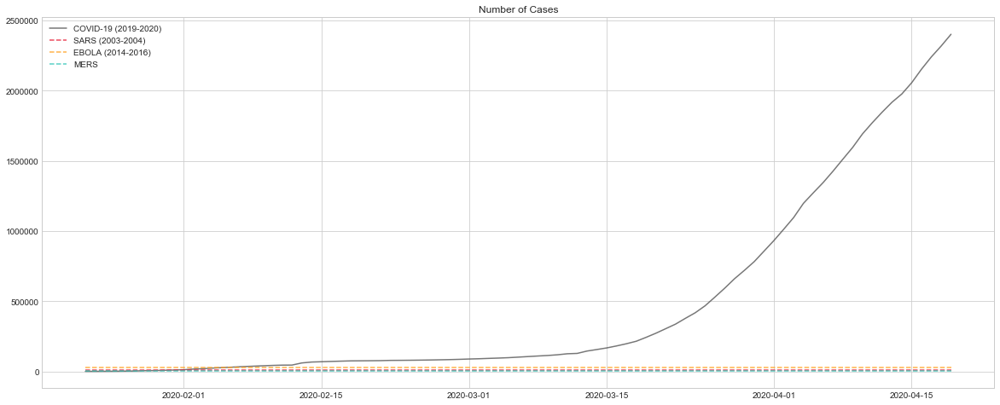

In [141]:
temp = covid_19.groupby('Date')['Cases'].sum().reset_index()

covid = temp['Cases']
sars = [8096 for i in range(len(temp))]
ebola = [28646 for i in range(len(temp))]
mers = [2494 for i in range(len(temp))]
h1n1 = [6724149 for i in range(len(temp))]

plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 8))
ax = plt.plot(temp['Date'], covid, label='COVID-19 (2019-2020)', c='#555555', alpha=0.8)
ax = plt.plot(temp['Date'], sars, label='SARS (2003-2004)', c='#E71D36', ls='--', alpha=0.8)
ax = plt.plot(temp['Date'], ebola, label='EBOLA (2014-2016)', c='#FF9F1C', ls='--', alpha=0.8)
ax = plt.plot(temp['Date'], mers, label='MERS', c='#2EC4B6', ls='--', alpha=0.8)
plt.title('Number of Cases')
plt.legend()
plt.show()

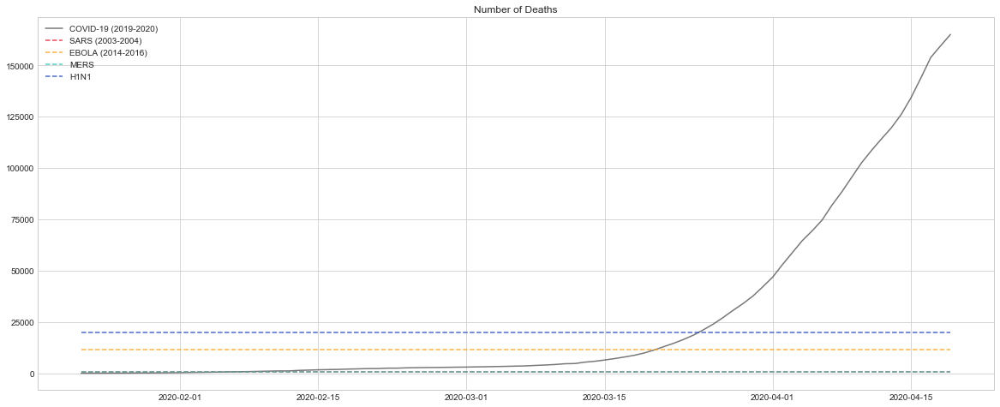

In [142]:
temp = covid_19.groupby('Date')['Deaths'].sum().reset_index()

covid = temp['Deaths']
sars = [774 for i in range(len(temp))]
ebola = [11323 for i in range(len(temp))]
mers = [858 for i in range(len(temp))]
h1n1 = [19654 for i in range(len(temp))]

plt.figure(figsize=(20, 8))
ax = plt.plot(temp['Date'], covid, label='COVID-19 (2019-2020)', c='#555555', alpha=0.8)
ax = plt.plot(temp['Date'], sars, label='SARS (2003-2004)', c='#E71D36', ls='--', alpha=0.8)
ax = plt.plot(temp['Date'], ebola, label='EBOLA (2014-2016)', c='#FF9F1C', ls='--', alpha=0.8)
ax = plt.plot(temp['Date'], mers, label='MERS', c='#2EC4B6', ls='--', alpha=0.8)
ax = plt.plot(temp['Date'], h1n1, label='H1N1', c='#2345BA', ls='--', alpha=0.8)
plt.title('Number of Deaths')
plt.legend()
plt.show()

### Conclusion <a class="anchor" id="conclusion"></a>

At this point, scientists have collaborated globally to boost research towards a vaccine.

Globally, we are not finished yet.  There are still many more confirmed cases that are not yet in the "recovered" category and much of the rest of the world is still below the inflection point on the Sigmoid curve.